# **Project: Supervised Learning**

## **Introduction**

**DOMAIN**: Banking

**CONTEXT**: A bank X is on a massive digital transformation for all its departments. Bank has a growing customer base whee majority of them are
liability customers (depositors) vs borrowers (asset customers). The bank is interested in expanding the borrowers base rapidly to bring in more
business via loan interests. A campaign that the bank ran in last quarter showed an average single digit conversion rate. Digital transformation
being the core strength of the business strategy, marketing department wants to devise effective campaigns with better target marketing to
increase the conversion ratio to double digit with same budget as per last campaign.

**DATA DICTIONARY**:
1. Team: Team's name
2. ID: Customer ID
3. Age: Customer's approximate age.
4. CustomerSince: Customer of the bank since. [unit is masked]
5. HighestSpend: Customer's highest spend so far in one transaction. [unit is masked]
6. ZipCode: Customer's zip code.
7. HiddenScore: A score associated to the customer which is masked by the bank as an IP.
8. MonthlyAverageSpend: Customer's monthly average spend so far. [unit is masked]
9. Level: A level associated to the customer which is masked by the bank as an IP.
10. Mortgage: Customer's mortgage. [unit is masked]
11. Security: Customer's security asset with the bank. [unit is masked]
12. FixedDepositAccount: Customer's fixed deposit account with the bank. [unit is masked]
13. InternetBanking: if the customer uses internet banking.
14. CreditCard: if the customer uses bank's credit card.
15. LoanOnCard: if the customer has a loan on credit card.

Import Required Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import SMOTENC

%matplotlib inline

## Load the dataset

In [2]:
# Read data as dataframe and display the shape and columns
data1 = pd.read_csv('Data1.csv')
print('Shape of Data1: ', data1.shape)
print(data1.columns)

Shape of Data1:  (5000, 8)
Index(['ID', 'Age', 'CustomerSince', 'HighestSpend', 'ZipCode', 'HiddenScore',
       'MonthlyAverageSpend', 'Level'],
      dtype='object')


In [3]:
# Read data as dataframe and display the shape and columns
data2 = pd.read_csv('Data2.csv')
print('Shape of Data1: ', data2.shape)
print(data2.columns)

Shape of Data1:  (5000, 7)
Index(['ID', 'Mortgage', 'Security', 'FixedDepositAccount', 'InternetBanking',
       'CreditCard', 'LoanOnCard'],
      dtype='object')


Merge both the Dataframes on 'ID' feature to form a single DataFrame

In [4]:
custdata = data1.merge(data2, how='inner',on='ID')
custdata.shape

(5000, 14)

In [5]:
custdata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   5000 non-null   int64  
 1   Age                  5000 non-null   int64  
 2   CustomerSince        5000 non-null   int64  
 3   HighestSpend         5000 non-null   int64  
 4   ZipCode              5000 non-null   int64  
 5   HiddenScore          5000 non-null   int64  
 6   MonthlyAverageSpend  5000 non-null   float64
 7   Level                5000 non-null   int64  
 8   Mortgage             5000 non-null   int64  
 9   Security             5000 non-null   int64  
 10  FixedDepositAccount  5000 non-null   int64  
 11  InternetBanking      5000 non-null   int64  
 12  CreditCard           5000 non-null   int64  
 13  LoanOnCard           4980 non-null   float64
dtypes: float64(2), int64(12)
memory usage: 585.9 KB


In [6]:
custdata.head()

,ID,Age,CustomerSince,HighestSpend,ZipCode,HiddenScore,MonthlyAverageSpend,Level,Mortgage,Security,FixedDepositAccount,InternetBanking,CreditCard,LoanOnCard
0,1,25,1,49,91107,4,1.6,1,0,1,0,0,0,NaN
1,2,45,19,34,90089,3,1.5,1,0,1,0,0,0,NaN
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,NaN
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,NaN
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,1,NaN


Values in the following features are classes identified as integers while they are categorical. Hence modify data type to object:

'CreditCard’, ‘InternetBanking’, ‘FixedDepositAccount’, ‘Security’, ‘Level’, ‘HiddenScore’.

In [7]:
columns = ['CreditCard', 'InternetBanking', 'FixedDepositAccount', 'Security', 'Level', 'HiddenScore']
custdata = custdata.astype({col: object for col in columns})

In [8]:
custdata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   5000 non-null   int64  
 1   Age                  5000 non-null   int64  
 2   CustomerSince        5000 non-null   int64  
 3   HighestSpend         5000 non-null   int64  
 4   ZipCode              5000 non-null   int64  
 5   HiddenScore          5000 non-null   object 
 6   MonthlyAverageSpend  5000 non-null   float64
 7   Level                5000 non-null   object 
 8   Mortgage             5000 non-null   int64  
 9   Security             5000 non-null   object 
 10  FixedDepositAccount  5000 non-null   object 
 11  InternetBanking      5000 non-null   object 
 12  CreditCard           5000 non-null   object 
 13  LoanOnCard           4980 non-null   float64
dtypes: float64(2), int64(6), object(6)
memory usage: 585.9+ KB


## Data Preparation and Exploration

Data Exploration and Analysis

Visualize distribution of Target variable 'LoanOnCard'

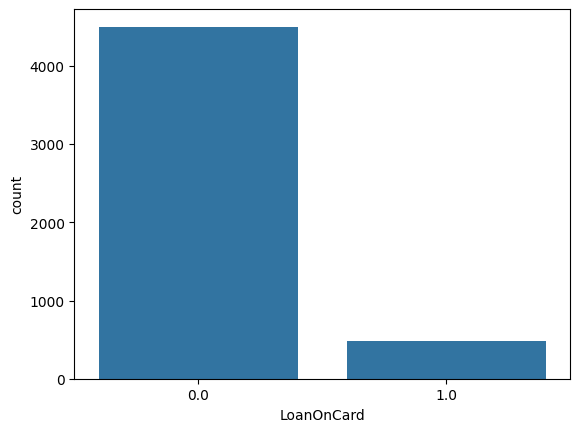

In [9]:
sns.countplot(data=custdata, x='LoanOnCard');

In [10]:
custdata['LoanOnCard'].value_counts()

0.0    4500
1.0     480
Name: LoanOnCard, dtype: int64

The dataset is clearly imbalanced with over 90% of the data being 0 on LoanOnCard

Check the percentage of missing values and impute if required.

In [11]:
custdata.isnull().sum()

ID                      0
Age                     0
CustomerSince           0
HighestSpend            0
ZipCode                 0
HiddenScore             0
MonthlyAverageSpend     0
Level                   0
Mortgage                0
Security                0
FixedDepositAccount     0
InternetBanking         0
CreditCard              0
LoanOnCard             20
dtype: int64

There are 20 rows having null value on LoanOnCard

Since the null values is 0.4% of the entire dataset, we can drop the null values

In [12]:
custdata.dropna(axis=0,inplace=True)

In [13]:
custdata.isnull().sum()

ID                     0
Age                    0
CustomerSince          0
HighestSpend           0
ZipCode                0
HiddenScore            0
MonthlyAverageSpend    0
Level                  0
Mortgage               0
Security               0
FixedDepositAccount    0
InternetBanking        0
CreditCard             0
LoanOnCard             0
dtype: int64

In [14]:
custdata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4980 entries, 9 to 4999
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   4980 non-null   int64  
 1   Age                  4980 non-null   int64  
 2   CustomerSince        4980 non-null   int64  
 3   HighestSpend         4980 non-null   int64  
 4   ZipCode              4980 non-null   int64  
 5   HiddenScore          4980 non-null   object 
 6   MonthlyAverageSpend  4980 non-null   float64
 7   Level                4980 non-null   object 
 8   Mortgage             4980 non-null   int64  
 9   Security             4980 non-null   object 
 10  FixedDepositAccount  4980 non-null   object 
 11  InternetBanking      4980 non-null   object 
 12  CreditCard           4980 non-null   object 
 13  LoanOnCard           4980 non-null   float64
dtypes: float64(2), int64(6), object(6)
memory usage: 583.6+ KB


Check for unexpected values in each categorical variable and impute with best suitable value

In [15]:
print('Values for HiddenScore:')
print(custdata['HiddenScore'].value_counts())
print('Values for Level:')
print(custdata['Level'].value_counts())
print('Values for Security:')
print(custdata['Security'].value_counts())
print('Values for FixedDepositAccount:')
print(custdata['FixedDepositAccount'].value_counts())
print('Values for InternetBanking:')
print(custdata['InternetBanking'].value_counts())
print('Values for CreditCard:')
print(custdata['CreditCard'].value_counts())

Values for HiddenScore:
1    1466
2    1293
4    1215
3    1006
Name: HiddenScore, dtype: int64
Values for Level:
1    2089
3    1496
2    1395
Name: Level, dtype: int64
Values for Security:
0    4460
1     520
Name: Security, dtype: int64
Values for FixedDepositAccount:
0    4678
1     302
Name: FixedDepositAccount, dtype: int64
Values for InternetBanking:
1    2974
0    2006
Name: InternetBanking, dtype: int64
Values for CreditCard:
0    3514
1    1466
Name: CreditCard, dtype: int64


Based on the above value counts, there is no unexpected values in the categorical features.

### Exploratory Data Analysis

Univariate Analysis

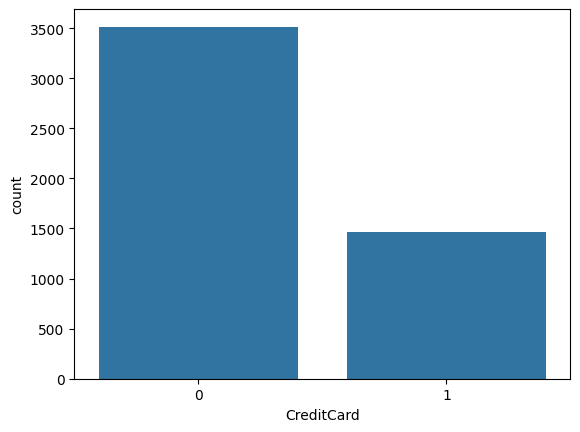

In [16]:
sns.countplot(data=custdata, x='CreditCard');

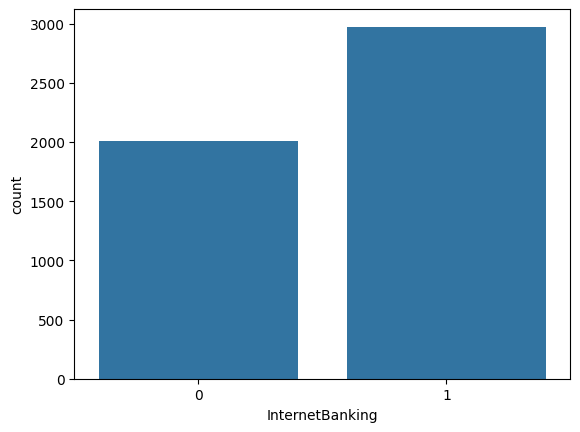

In [17]:
sns.countplot(data=custdata, x='InternetBanking');

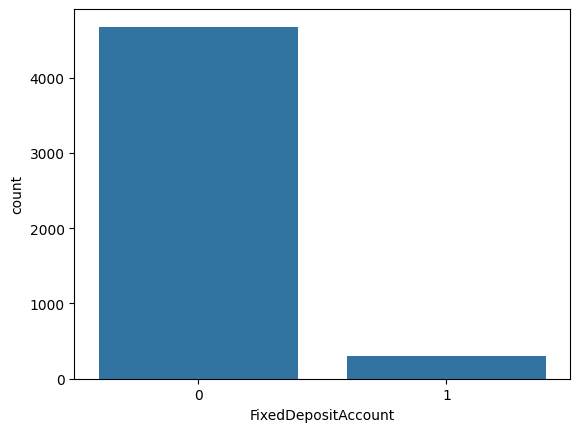

In [18]:
sns.countplot(data=custdata, x='FixedDepositAccount');

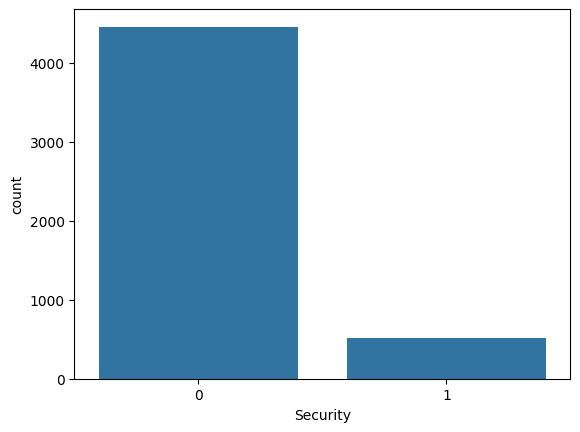

In [19]:
sns.countplot(data=custdata, x='Security');

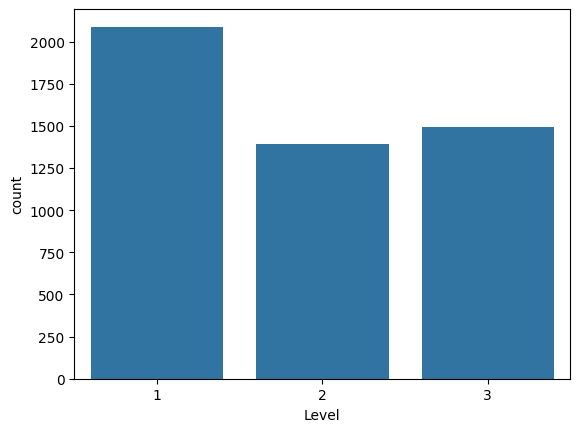

In [20]:
sns.countplot(data=custdata, x='Level');

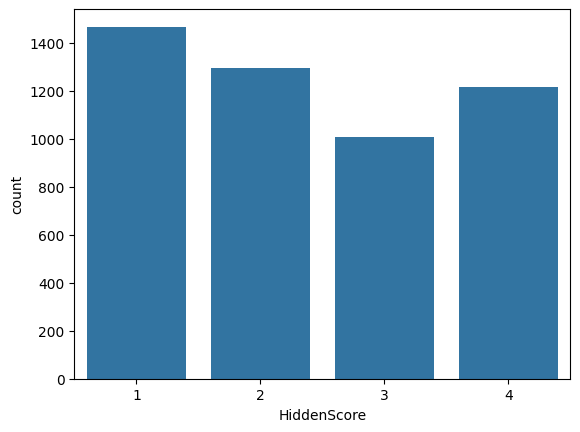

In [21]:
sns.countplot(data=custdata, x='HiddenScore');

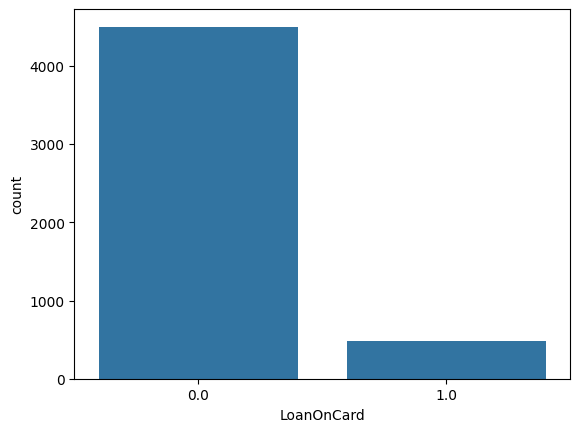

In [22]:
sns.countplot(data=custdata, x='LoanOnCard');

<ipython-input-23-96715d44a38d>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(custdata['Age'],  ax=axes[0],color='Green')


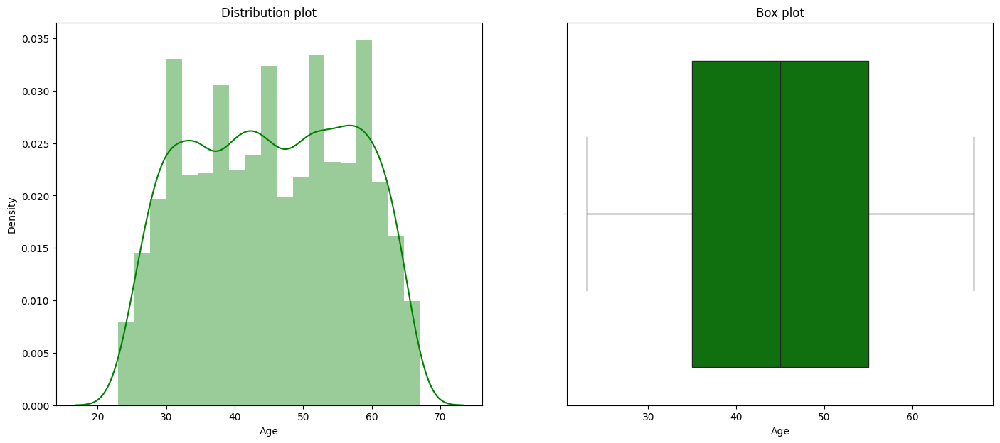

In [23]:
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.boxplot(x = 'Age', data=custdata,  orient='h' , ax=axes[1],color='Green')
sns.distplot(custdata['Age'],  ax=axes[0],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

<ipython-input-24-f7c789907816>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(custdata['CustomerSince'],  ax=axes[0],color='Green')


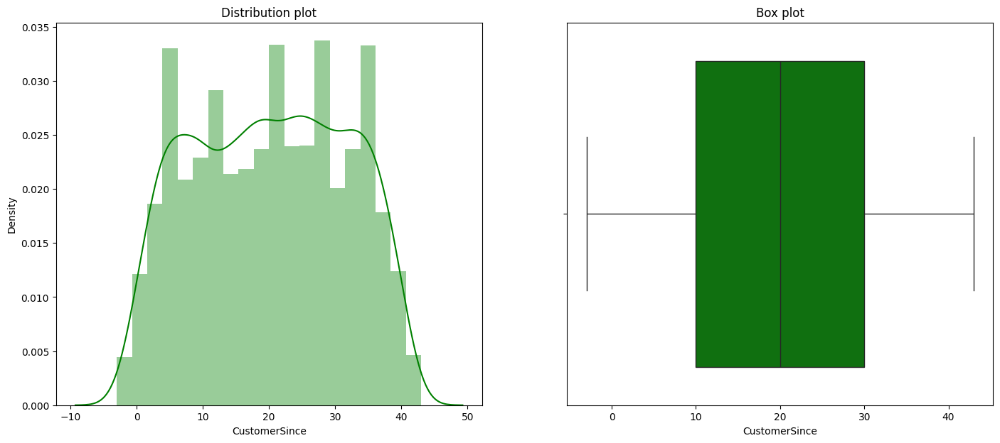

In [24]:
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.boxplot(x = 'CustomerSince', data=custdata,  orient='h' , ax=axes[1],color='Green')
sns.distplot(custdata['CustomerSince'],  ax=axes[0],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

<ipython-input-25-a09ec8f849ca>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(custdata['HighestSpend'],  ax=axes[0],color='Green')


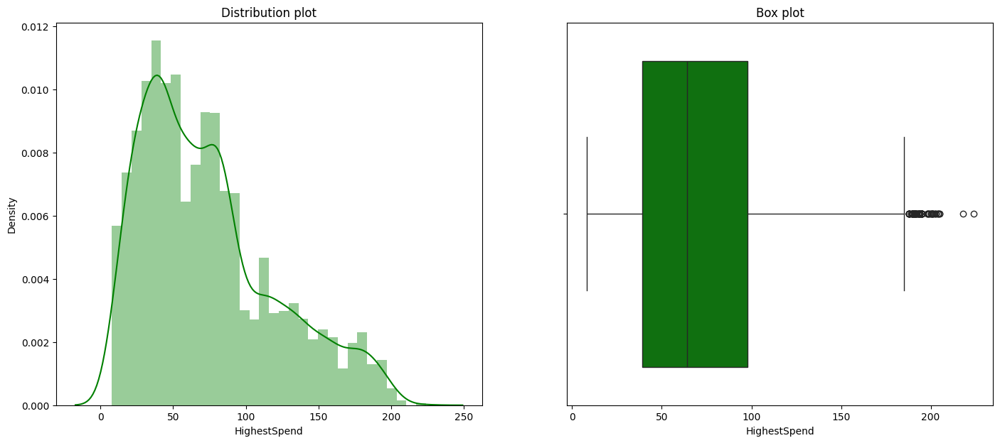

In [25]:
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.boxplot(x = 'HighestSpend', data=custdata,  orient='h' , ax=axes[1],color='Green')
sns.distplot(custdata['HighestSpend'],  ax=axes[0],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

<ipython-input-26-396f1b272220>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(custdata['MonthlyAverageSpend'],  ax=axes[0],color='Green')


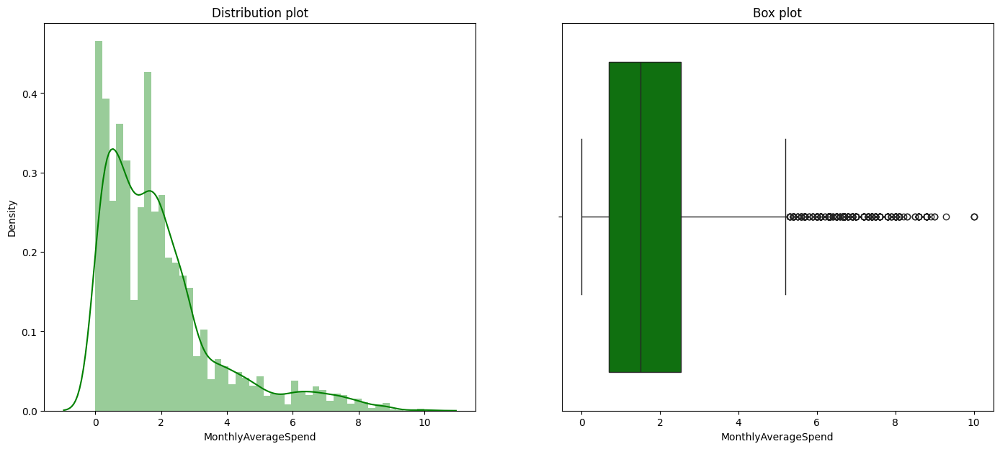

In [26]:
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.boxplot(x = 'MonthlyAverageSpend', data=custdata,  orient='h' , ax=axes[1],color='Green')
sns.distplot(custdata['MonthlyAverageSpend'],  ax=axes[0],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

<ipython-input-27-eb99f0b4a0a0>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(custdata['Mortgage'],  ax=axes[0],color='Green')


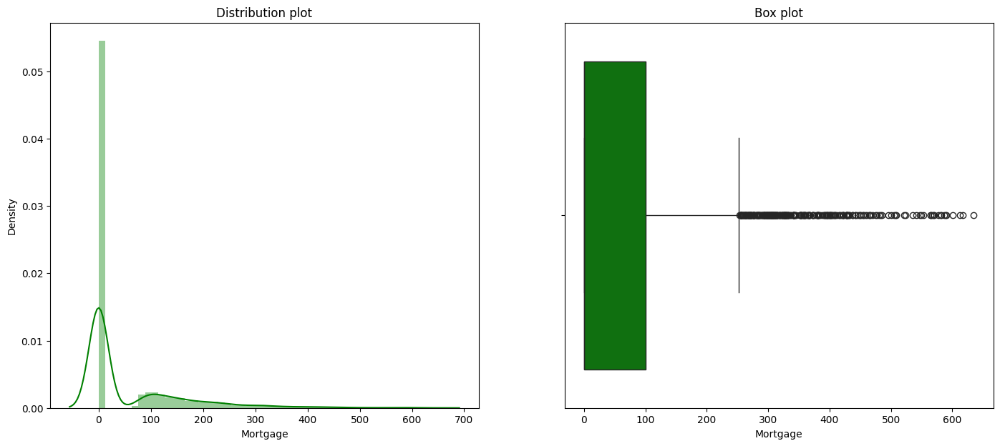

In [27]:
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.boxplot(x = 'Mortgage', data=custdata,  orient='h' , ax=axes[1],color='Green')
sns.distplot(custdata['Mortgage'],  ax=axes[0],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

Bivariate Analysis

<ipython-input-28-5671c002b24f>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(custdata.corr(), annot=True);


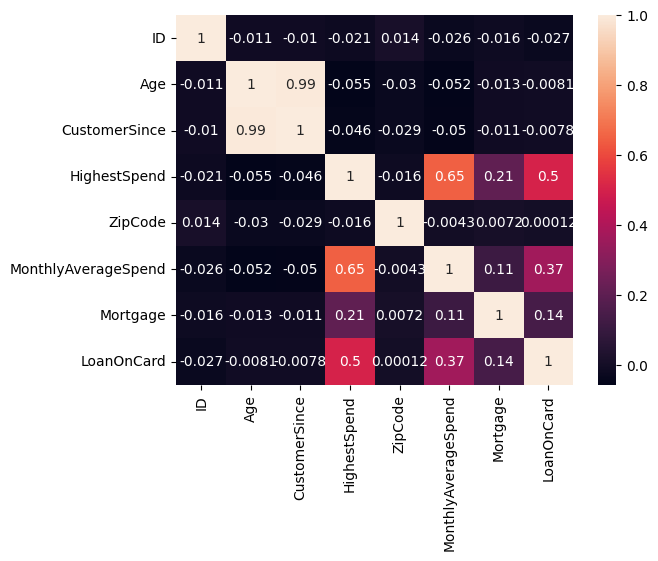

In [28]:
sns.heatmap(custdata.corr(), annot=True);

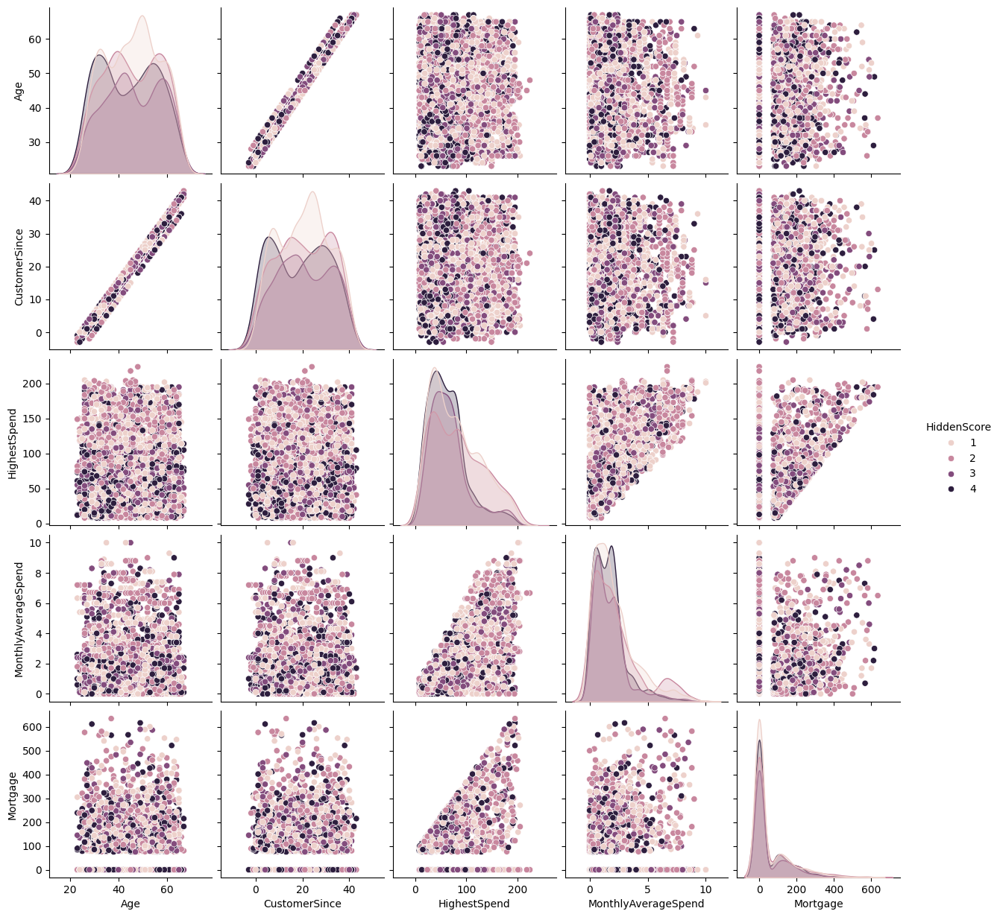

In [29]:
sns.pairplot(data=custdata,vars=['Age','CustomerSince','HighestSpend','MonthlyAverageSpend','Mortgage'], hue='HiddenScore');

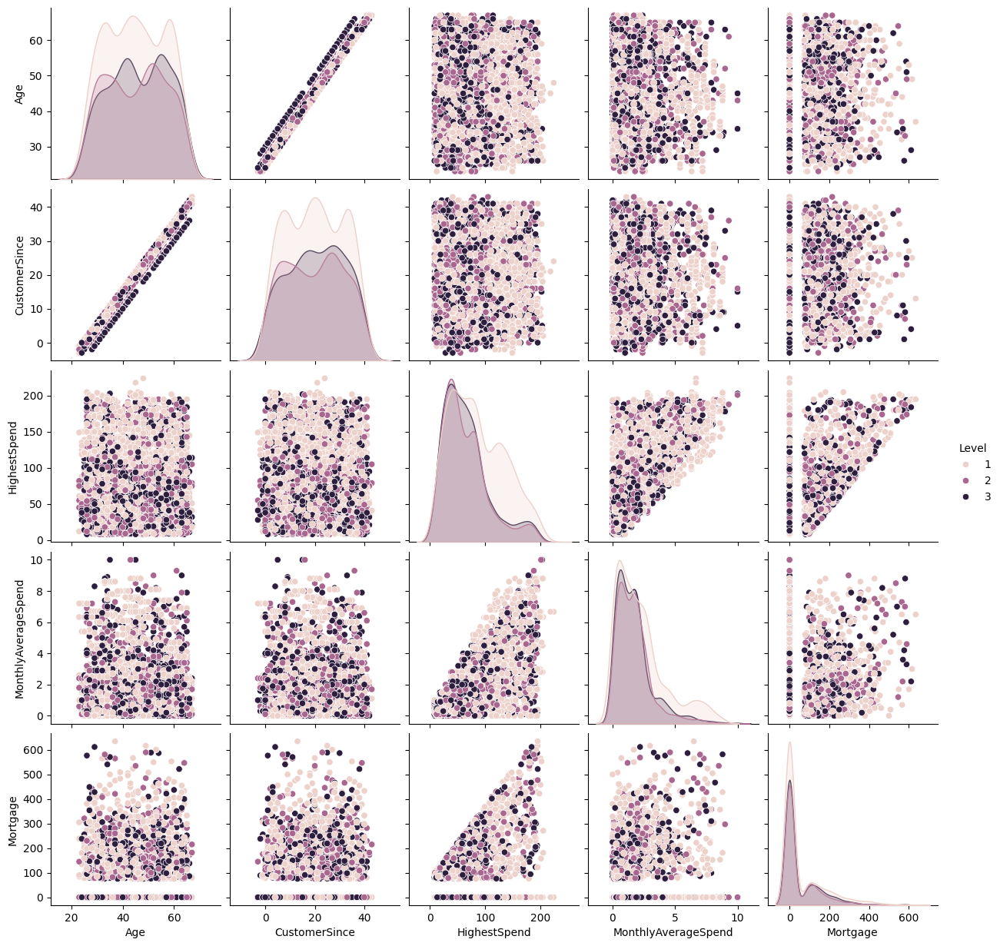

In [30]:
sns.pairplot(data=custdata,vars=['Age','CustomerSince','HighestSpend','MonthlyAverageSpend','Mortgage'], hue='Level');

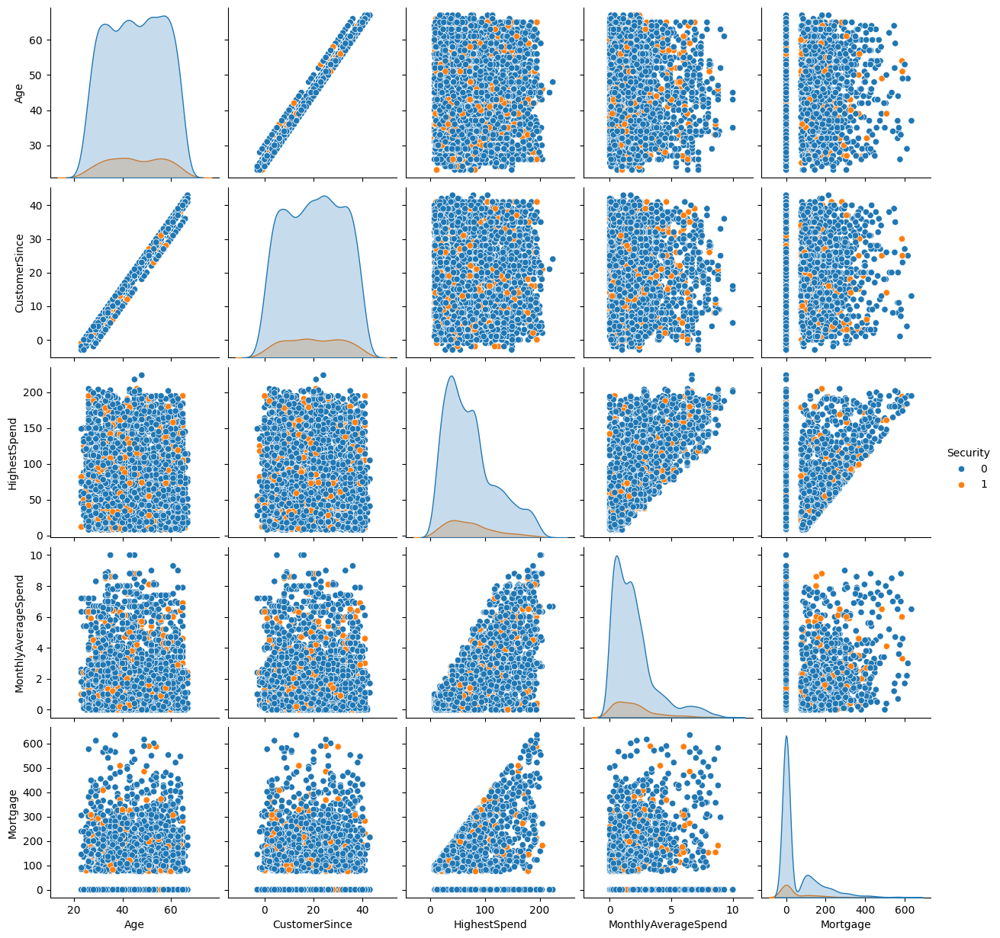

In [31]:
sns.pairplot(data=custdata,vars=['Age','CustomerSince','HighestSpend','MonthlyAverageSpend','Mortgage'], hue='Security');

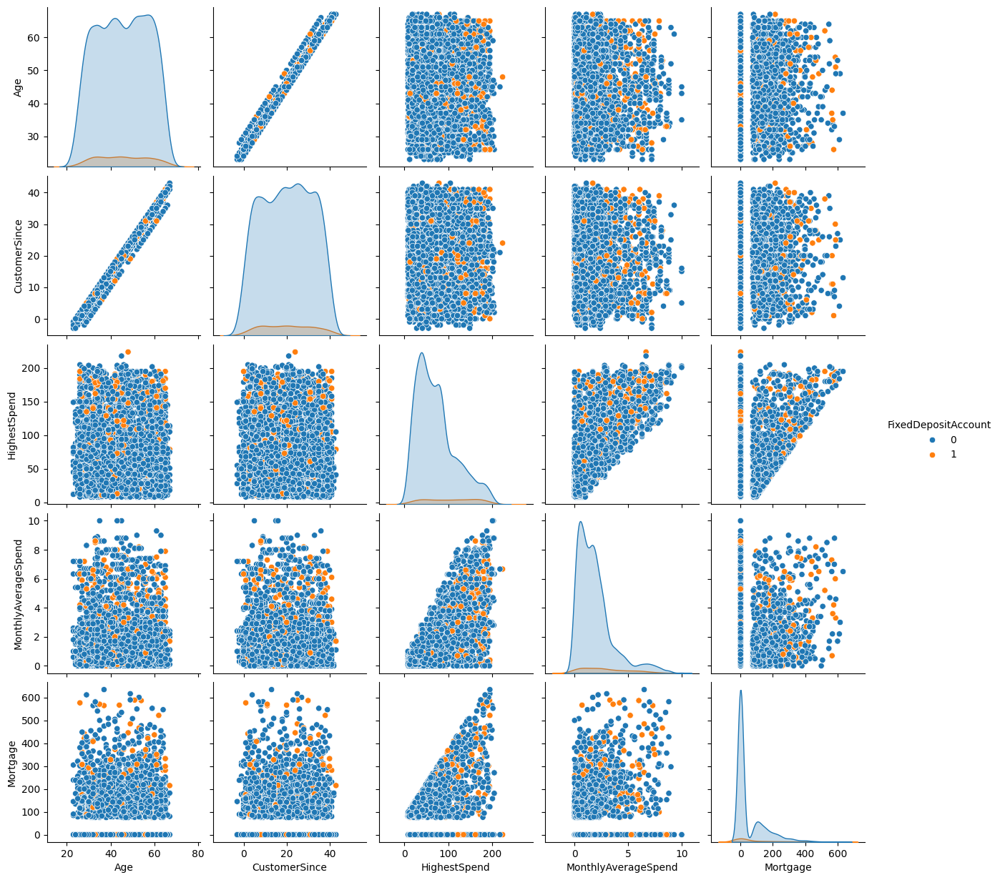

In [32]:
sns.pairplot(data=custdata,vars=['Age','CustomerSince','HighestSpend','MonthlyAverageSpend','Mortgage'], hue='FixedDepositAccount');

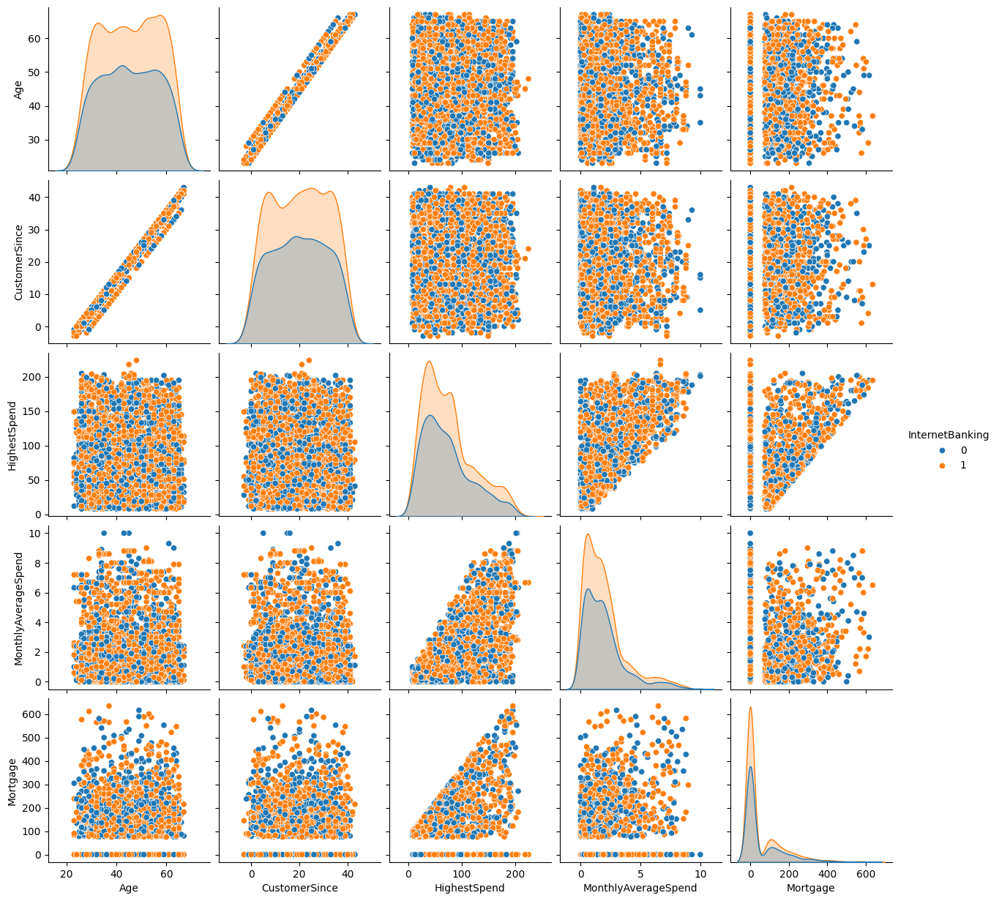

In [33]:
sns.pairplot(data=custdata,vars=['Age','CustomerSince','HighestSpend','MonthlyAverageSpend','Mortgage'], hue='InternetBanking');

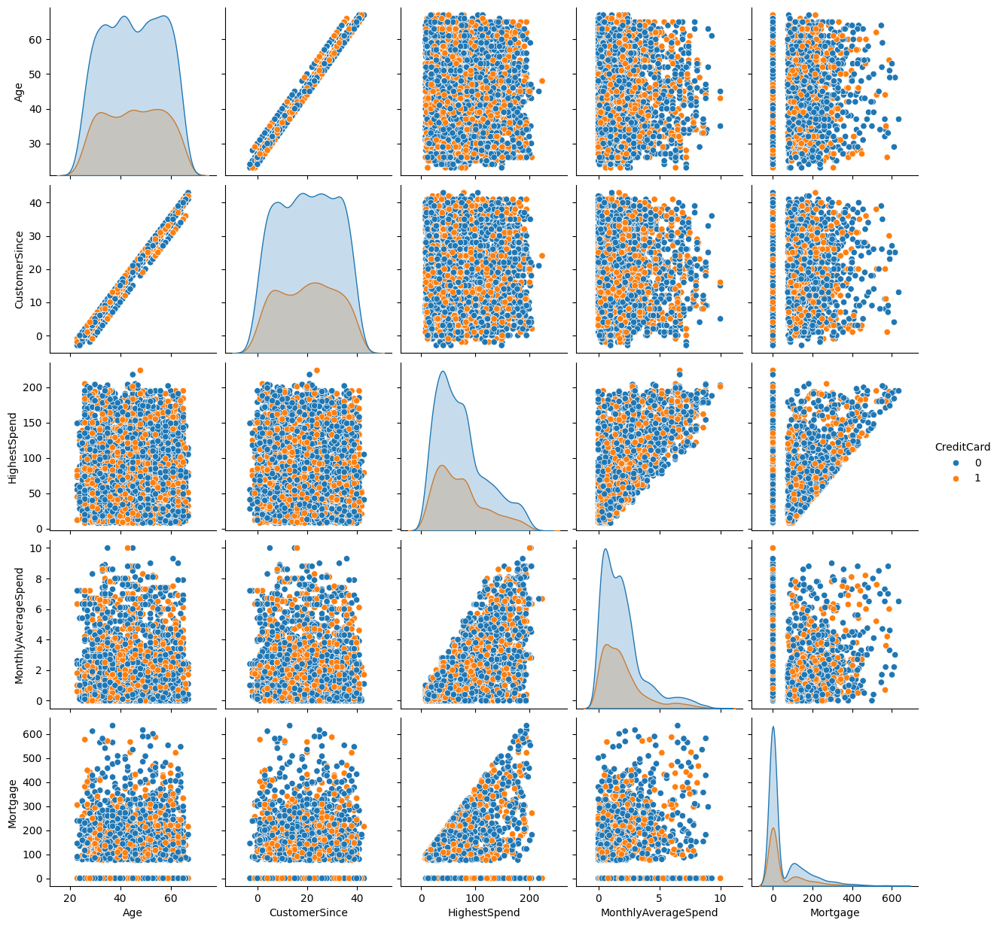

In [34]:
sns.pairplot(data=custdata,vars=['Age','CustomerSince','HighestSpend','MonthlyAverageSpend','Mortgage'], hue='CreditCard');

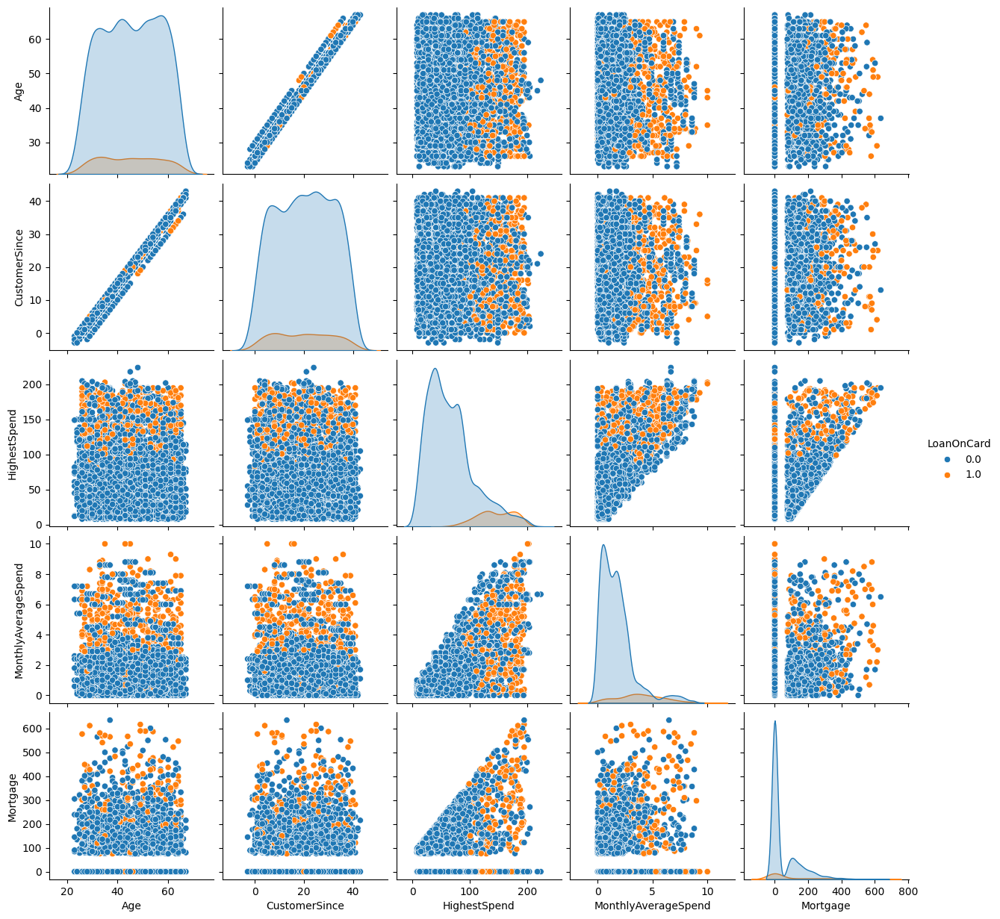

In [35]:
sns.pairplot(data=custdata,vars=['Age','CustomerSince','HighestSpend','MonthlyAverageSpend','Mortgage'], hue='LoanOnCard');

## Model Training

Drop column 'ID' and 'Zipcode' since it would not have any useful information in building the model

In [36]:
custdata.drop(['ID','ZipCode'], axis=1, inplace=True)

In [37]:
X=custdata.drop(columns='LoanOnCard')
y=custdata['LoanOnCard']

In [38]:
y.value_counts()

0.0    4500
1.0     480
Name: LoanOnCard, dtype: int64

Split data into train and test. Keep 25% data reserved for testing

In [39]:
# Split data into train and test with 75:25 proportion
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

Train a Supervised Learning Classification base model - Logistic Regression

In [40]:
lr = LogisticRegression(solver="liblinear")
lr.fit(X_train, y_train)
lr_pred = lr.predict(X_test)

coef_df = pd.DataFrame(lr.coef_)
coef_df['intercept'] = lr.intercept_
print(coef_df)

print('Accuracy on Training data:',lr.score(X_train, y_train) )
print('Accuracy on Test data:',lr.score(X_test, y_test) )

          0         1         2         3         4         5        6  \
0 -0.389217  0.391307  0.050463  0.623206  0.116379  1.670522  0.00038   

         7         8         9        10  intercept  
0 -0.67837  3.285278 -0.648381 -0.980495  -2.675401  
Accuracy on Training data: 0.9504685408299867
Accuracy on Test data: 0.9477911646586346


The Logistic Regression model gives a very good accuracy of 95% on the training set and 94.8% on the test data.

Print evaluation metrics for the model

<Axes: >

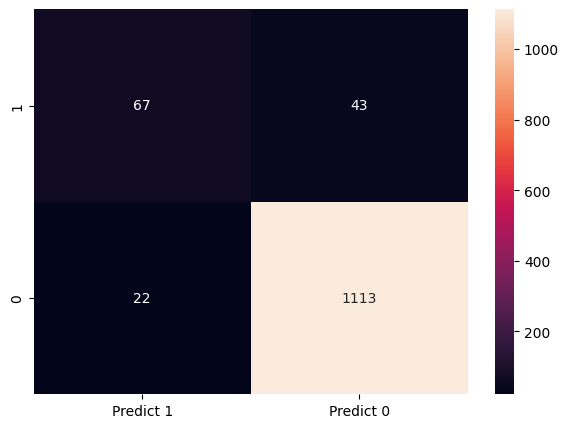

In [41]:
cm=metrics.confusion_matrix(y_test, lr_pred, labels=[1, 0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                  columns = [i for i in ["Predict 1","Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

In [42]:
print("classification  Matrix:\n",classification_report(y_test,lr_pred))

classification  Matrix:
               precision    recall  f1-score   support

         0.0       0.96      0.98      0.97      1135
         1.0       0.75      0.61      0.67       110

    accuracy                           0.95      1245
   macro avg       0.86      0.79      0.82      1245
weighted avg       0.94      0.95      0.95      1245



Although the accuracy of the model was good, precision and recall for the target of 1 are 0.75 and 0.61 respectively. This is primarily because of imbalance in the dataset where less than 10% of the data had target value as 1.

In order to balance the data, we can use SMOTE - Synthetic Minority Oversampling Technique to increase the number of rows having target value as 1.

In [43]:
smote_nc=SMOTENC(categorical_features=[3,5,7,8,9,10],random_state=42)
x_s,y_s=smote_nc.fit_resample(X,y)

In [44]:
print(y_s.value_counts())

1.0    4500
0.0    4500
Name: LoanOnCard, dtype: int64


In [45]:
X_train, X_test, y_train, y_test = train_test_split(x_s, y_s, test_size = 0.25, random_state = 0)

Train the Logistic Regression model on balanced data.

In [46]:
lr = LogisticRegression(solver="liblinear")
lr.fit(X_train, y_train)
lr_pred = lr.predict(X_test)

coef_df = pd.DataFrame(lr.coef_)
coef_df['intercept'] = lr.intercept_
print(coef_df)

print('Accuracy on Training data:',lr.score(X_train, y_train) )
print('Accuracy on Test data:',lr.score(X_test, y_test) )

          0       1         2         3         4         5         6  \
0 -0.294191  0.2984  0.052901  0.675419  0.252084  1.638082  0.001304   

          7         8         9        10  intercept  
0 -1.768936  3.012267 -0.073576 -1.428198  -4.036789  
Accuracy on Training data: 0.9084444444444445
Accuracy on Test data: 0.908


Accuracy of the model in training and test set are 90.8%

Print evaluation metrics

<Axes: >

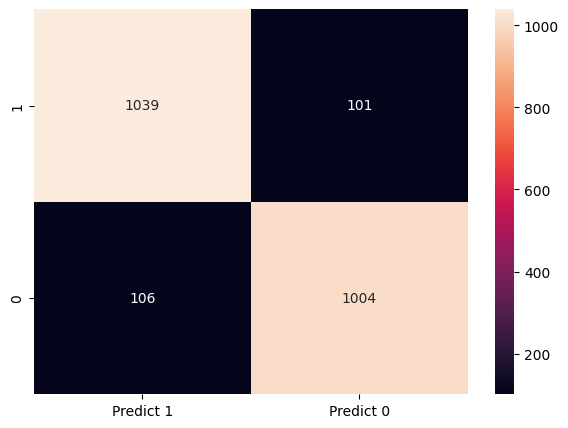

In [47]:
cm=metrics.confusion_matrix(y_test, lr_pred, labels=[1, 0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                  columns = [i for i in ["Predict 1","Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

In [48]:
print("classification  Matrix:\n",classification_report(y_test,lr_pred))

classification  Matrix:
               precision    recall  f1-score   support

         0.0       0.91      0.90      0.91      1110
         1.0       0.91      0.91      0.91      1140

    accuracy                           0.91      2250
   macro avg       0.91      0.91      0.91      2250
weighted avg       0.91      0.91      0.91      2250



Precision and Recall for target value as 1 has increased from 0.7 and 0.6 to 0.91. Although the accuracy of the model fell slightly lower, the increase in precision and recall has led to a better model for the prediction of the target value as 1.

## Model Improvement

Train a base model for SVM

In [49]:
clf = svm.SVC()
clf.fit(X_train , y_train)

SVC()

In [50]:
y_pred = clf.predict(X_test)

In [ ]:
print(clf.score(X_train, y_train))
print(clf.score(X_test, y_test))

0.8797037037037037
0.8795555555555555


Accuracy of the model on test data is 87.97%, while that on the training data is 87.95%.

<Axes: >

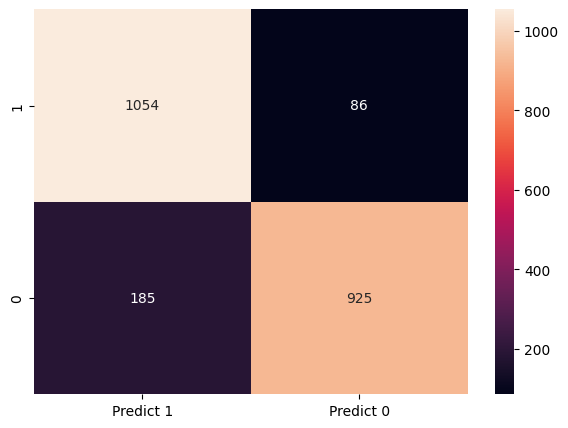

In [51]:
cm=metrics.confusion_matrix(y_test, y_pred, labels=[1, 0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                  columns = [i for i in ["Predict 1","Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

In [52]:
print("classification  Matrix:\n",classification_report(y_test,y_pred))

classification  Matrix:
               precision    recall  f1-score   support

         0.0       0.91      0.83      0.87      1110
         1.0       0.85      0.92      0.89      1140

    accuracy                           0.88      2250
   macro avg       0.88      0.88      0.88      2250
weighted avg       0.88      0.88      0.88      2250



Precision is quite low for target value as 1, while recall is low for target value as 0.

Tune hyperparameters to get the best values for C and gamma

In [53]:
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}

grid = GridSearchCV(svm.SVC(), param_grid, refit = True, verbose = 3)

# fitting the model for grid search
grid.fit(X_train, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.502 total time=   2.6s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.502 total time=   2.8s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.502 total time=   2.1s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.502 total time=   2.1s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.502 total time=   2.1s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.762 total time=   2.5s
[CV 2/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.759 total time=   3.4s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.765 total time=   2.5s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.770 total time=   2.5s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.776 total time=   2.5s
[CV 1/5] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.894 total time=   1.5s
[CV 2/5] END .....C=0.1, gamma=0.01, kernel=rbf

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             verbose=3)

In [54]:
# print best parameter after tuning
print(grid.best_params_)

# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}
SVC(C=1000, gamma=0.001)


In [55]:
grid_predictions = grid.predict(X_test)

# print classification report
print(classification_report(y_test, grid_predictions))

              precision    recall  f1-score   support

         0.0       0.99      0.96      0.97      1110
         1.0       0.96      0.99      0.97      1140

    accuracy                           0.97      2250
   macro avg       0.97      0.97      0.97      2250
weighted avg       0.97      0.97      0.97      2250



Train SVM model with best parameters identified as gamma=0.001, C=1000

In [56]:
clf = svm.SVC(gamma=0.001, C=1000, kernel='rbf')
clf.fit(X_train , y_train)

SVC(C=1000, gamma=0.001)

In [57]:
y_pred = clf.predict(X_test)

Print evaluation metrics for final model

<Axes: >

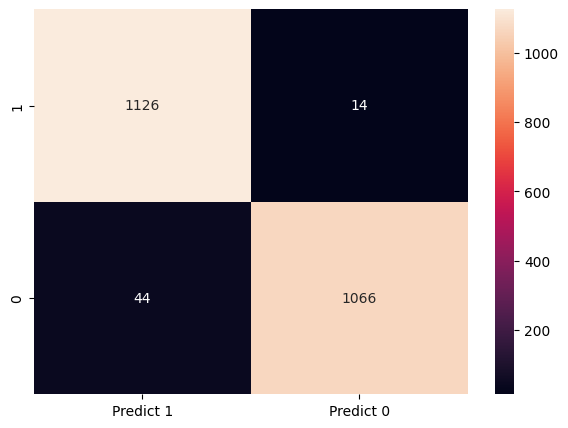

In [58]:
cm=metrics.confusion_matrix(y_test, y_pred, labels=[1, 0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                  columns = [i for i in ["Predict 1","Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

In [59]:
print("classification  Matrix:\n",classification_report(y_test,y_pred))

classification  Matrix:
               precision    recall  f1-score   support

         0.0       0.99      0.96      0.97      1110
         1.0       0.96      0.99      0.97      1140

    accuracy                           0.97      2250
   macro avg       0.97      0.97      0.97      2250
weighted avg       0.97      0.97      0.97      2250



After tuning the parameters, the accuracy of the model has increased from 88% to 97%.

Precision and Recall of both values of target variable has increased to 0.96/0.99. This model is better than the base model we had developed.

Train a base model for KNN

In [60]:
# Perform KNN with k = 5 and metric as Euclidean distance
classifier = KNeighborsClassifier()
classifier.fit(X_train, y_train)

KNeighborsClassifier()

In [61]:
# Predict the label in the test dataset
# Calculate the accuracy score
predicted_labels = classifier.predict(X_test)
classifier.score(X_test, y_test)

0.9266666666666666

<Axes: >

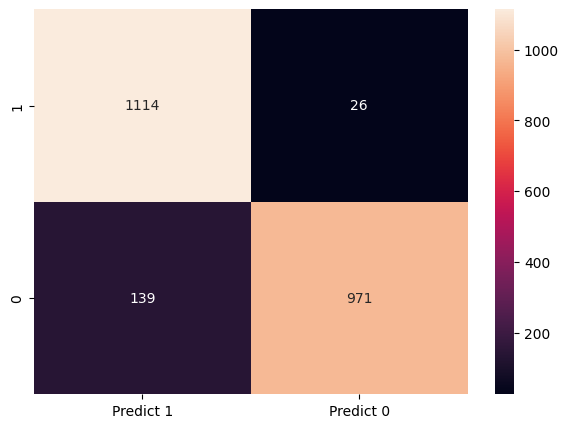

In [62]:
cm=metrics.confusion_matrix(y_test, predicted_labels, labels=[1, 0])

df_cm = pd.DataFrame(cm, index = [i for i in ["1","0"]],
                  columns = [i for i in ["Predict 1","Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')

In [63]:
print(classification_report(y_test, predicted_labels))

              precision    recall  f1-score   support

         0.0       0.97      0.87      0.92      1110
         1.0       0.89      0.98      0.93      1140

    accuracy                           0.93      2250
   macro avg       0.93      0.93      0.93      2250
weighted avg       0.93      0.93      0.93      2250



Base model has an accuracy of 92.67%
Precision for target value as 1 and recall for target value as 0 are 0.89 and 0.87 respectively.
Accuracy as well as precision and recall can be improved.

In [64]:
# calculating the accuracy of models with different values of k
mean_acc = np.zeros(20)
for i in range(1,21):
    #Train Model and Predict
    knn = KNeighborsClassifier(n_neighbors = i).fit(X_train,y_train)
    ypred= knn.predict(X_test)
    mean_acc[i-1] = metrics.accuracy_score(y_test, ypred)

mean_acc

array([0.94133333, 0.93866667, 0.93511111, 0.93955556, 0.92666667,
       0.92666667, 0.91688889, 0.92133333, 0.91422222, 0.91644444,
       0.90888889, 0.91022222, 0.90311111, 0.90622222, 0.90222222,
       0.90444444, 0.90088889, 0.90177778, 0.89955556, 0.90088889])

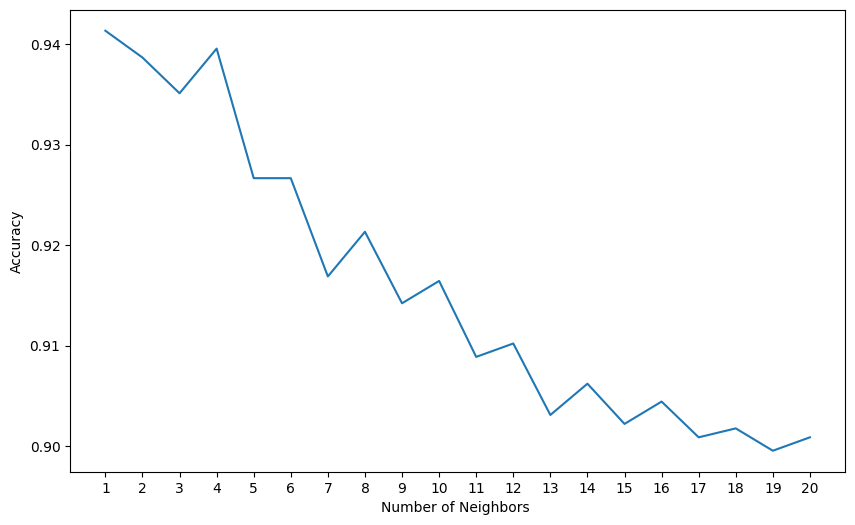

In [65]:
loc = np.arange(1,21,step=1.0)
plt.figure(figsize = (10, 6))
plt.plot(range(1,21), mean_acc)
plt.xticks(loc)
plt.xlabel('Number of Neighbors ')
plt.ylabel('Accuracy')
plt.show()

For increasing values of K, the accuracy decreases.

In [66]:
grid_params = { 'n_neighbors' : [3,5,7,9],
               'weights' : ['uniform','distance'],
               'metric' : ['minkowski','euclidean','manhattan']}

gs = GridSearchCV(KNeighborsClassifier(), grid_params, verbose = 1, cv=3)

# fit the model on our train set
g_res = gs.fit(X_train, y_train)

Fitting 3 folds for each of 24 candidates, totalling 72 fits


In [67]:
g_res.best_score_

0.9377777777777778

In [68]:
g_res.best_params_

{'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}

In [69]:
classifier = KNeighborsClassifier(n_neighbors = 3, weights = 'distance',algorithm = 'brute',metric = 'manhattan')
classifier.fit(X_train, y_train)

KNeighborsClassifier(algorithm='brute', metric='manhattan', n_neighbors=3,
                     weights='distance')

In [70]:
# Predict the label in the test dataset
# Calculate the accuracy score
predicted_labels = classifier.predict(X_test)
classifier.score(X_test, y_test)

0.9466666666666667

Print evaluation metrics for the best model

In [71]:
print(classification_report(y_test, predicted_labels))

              precision    recall  f1-score   support

         0.0       0.99      0.90      0.94      1110
         1.0       0.91      0.99      0.95      1140

    accuracy                           0.95      2250
   macro avg       0.95      0.95      0.95      2250
weighted avg       0.95      0.95      0.95      2250



Based on the tuned parameters, the accuracy has increased from 92.67% to 94.67%.

Precision and Recall have also improved and are >=0.9 for both the target classes, while Precision was 0.89 for 1 and recall was 0.87 for 0

This model is better than the base model.